# Monet Style Transfer with Generative Adversarial Networks (GANs)

In [ ]:
!pip install matplotlib


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.9/101.9 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 36.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.0/325.0 kB 26.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 51.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 45.1 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.7/107.7 kB 16.4 MB/s eta 0:00:00


Step 1: Import required libraries

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import save_image
from torch.cuda.amp import GradScaler, autocast  # Added for mixed precision

# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


Step 2: Define paths for monet and photo data. Perform data augmentation on images to improve training of model

In [ ]:
import os
from torchvision import transforms

# Paths to dataset (adjust these based on your local setup)
monet_dir = r"monet_jpg"  # Replace with actual path
photo_dir = r"photo_jpg"  # Replace with actual path
output_dir = "output"     # Directory to save generated images

# Validate directories
for dir_path in [monet_dir, photo_dir]:
    if not os.path.exists(dir_path) or not os.listdir(dir_path):
        raise ValueError(f"Directory {dir_path} does not exist or is empty!")
os.makedirs(output_dir, exist_ok=True)

# Image size parameter (default 256 as per CycleGAN paper)
IMG_SIZE = 256

# Image transformations with augmentation
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE + 30, IMG_SIZE + 30)),  # Resize larger for random crop
    transforms.RandomCrop((IMG_SIZE, IMG_SIZE)),        # Crop to final size
    transforms.RandomHorizontalFlip(p=0.5),             # Horizontal flip for augmentation
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),  # Subtle jitter
    transforms.ToTensor(),                              # Convert to tensor (0 to 1)
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize to [-1, 1]
])

# Log setup details
print(f"Environment setup complete!")
print(f"Monet images: {len(os.listdir(monet_dir))}, Photo images: {len(os.listdir(photo_dir))}")

Environment setup complete!
Monet images: 260, Photo images: 7038


Step 3: Assigned batch size as 1 and number of workers as 2. Visualized a sample photo and monet image from the dataset.

Monet batch shape: torch.Size([1, 3, 256, 256])
Photo batch shape: torch.Size([1, 3, 256, 256])
Visualizing a sample pair:


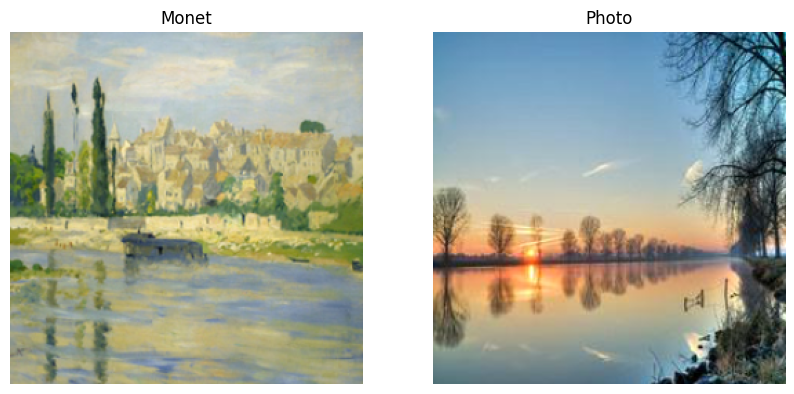

In [ ]:
import os
from torch.utils.data import Dataset, DataLoader
import torch
from PIL import Image
import matplotlib.pyplot as plt

class MonetPhotoDataset(Dataset):
    def __init__(self, monet_dir, photo_dir, transform=None):
        self.monet_dir = monet_dir
        self.photo_dir = photo_dir
        self.transform = transform

        # List image files only
        self.monet_images = sorted([f for f in os.listdir(monet_dir) if f.endswith(('.jpg', '.png'))])
        self.photo_images = sorted([f for f in os.listdir(photo_dir) if f.endswith(('.jpg', '.png'))])

        self.num_monet = len(self.monet_images)
        self.num_photos = len(self.photo_images)

        # Warn if heavily imbalanced
        if min(self.num_monet, self.num_photos) < 0.1 * max(self.num_monet, self.num_photos):
            print(f"Warning: Datasets imbalanced ({self.num_monet} Monet vs {self.num_photos} photos)")

    def __len__(self):
        return max(self.num_monet, self.num_photos)

    def __getitem__(self, idx):
        monet_idx = idx % self.num_monet
        photo_idx = idx % self.num_photos

        monet_path = os.path.join(self.monet_dir, self.monet_images[monet_idx])
        photo_path = os.path.join(self.photo_dir, self.photo_images[photo_idx])

        try:
            monet_img = Image.open(monet_path).convert("RGB")
            photo_img = Image.open(photo_path).convert("RGB")
        except Exception as e:
            print(f"Error loading image: {e}")
            # Return blank images if loading fails
            monet_img = Image.new("RGB", (256, 256))
            photo_img = Image.new("RGB", (256, 256))

        if self.transform:
            monet_img = self.transform(monet_img)
            photo_img = self.transform(photo_img)

        return monet_img, photo_img

# Create dataset and dataloader
dataset = MonetPhotoDataset(monet_dir, photo_dir, transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=2, pin_memory=torch.cuda.is_available())

# Test the dataloader
monet_batch, photo_batch = next(iter(dataloader))
print(f"Monet batch shape: {monet_batch.shape}")
print(f"Photo batch shape: {photo_batch.shape}")

# Visualize a sample side-by-side
def show_image_pair(monet_tensor, photo_tensor):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    for ax, tensor, title in [(ax1, monet_tensor, "Monet"), (ax2, photo_tensor, "Photo")]:
        img = tensor[0] * 0.5 + 0.5  # Denormalize
        img = img.numpy().transpose(1, 2, 0)  # HWC
        ax.imshow(img)
        ax.set_title(title)
        ax.axis("off")
    plt.show()

print("Visualizing a sample pair:")
show_image_pair(monet_batch, photo_batch)

Step 4: Defined the residual block, geneartor according to the research paper with self attention, and discriminator according to the paper

In [ ]:
import torch
import torch.nn as nn

# Residual Block (unchanged, matches paper with ReflectionPad2d)
class ResBlock(nn.Module):
    def __init__(self, dim):
        super(ResBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, bias=False),
            nn.InstanceNorm2d(dim),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, bias=False),
            nn.InstanceNorm2d(dim)
        )

    def forward(self, x):
        return x + self.block(x)

# Generator (aligned with paper + optional self-attention)
class Generator(nn.Module):
    def __init__(self, use_attention=False):
        super(Generator, self).__init__()
        # Initial 7x7 conv (paper uses 7x7)
        self.initial = nn.Sequential(
            nn.ReflectionPad2d(3),  # Padding for 7x7 kernel
            nn.Conv2d(3, 64, 7, padding=0, bias=False),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        # Downsampling
        self.down1 = nn.Sequential(
            nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True)
        )
        self.down2 = nn.Sequential(
            nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True)
        )
        # Residual blocks (9 as per paper)
        self.res_blocks = nn.Sequential(*[ResBlock(256) for _ in range(9)])
        # Optional self-attention
        self.attention = SelfAttention(256) if use_attention else nn.Identity()
        # Upsampling
        self.up1 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True)
        )
        self.up2 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        # Final 7x7 conv
        self.final = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, 3, 7, padding=0, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.initial(x)
        x = self.down1(x)
        x = self.down2(x)
        x = self.res_blocks(x)
        x = self.attention(x)
        x = self.up1(x)
        x = self.up2(x)
        x = self.final(x)
        return x

# Discriminator (70x70 PatchGAN from paper)
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(input_channels, 64, 4, stride=2, padding=1, bias=True),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, stride=1, padding=1, bias=False),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, stride=1, padding=1, bias=False)
        )

    def forward(self, x):
        return self.model(x)

# Weight initialization function
def init_weights(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Instantiate models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
G_photo_to_monet = Generator(use_attention=False).to(device)
G_monet_to_photo = Generator(use_attention=False).to(device)
D_photo = Discriminator().to(device)
D_monet = Discriminator().to(device)

# Apply weight initialization
G_photo_to_monet.apply(init_weights)
G_monet_to_photo.apply(init_weights)
D_photo.apply(init_weights)
D_monet.apply(init_weights)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
  )
)

cell 5

In [ ]:
import torch.nn as nn
import torch.optim as optim

# Loss functions
adversarial_loss = nn.MSELoss()  # LSGAN loss, per paper
cycle_loss_fn = nn.L1Loss()      # Cycle consistency, per paper
identity_loss_fn = nn.L1Loss()   # Identity loss, optional but common

# Loss weights (aligned with paper defaults)
lambda_cycle = 10.0    # Paper’s default for balanced cycle consistency
lambda_identity = 5.0  # Common value (0.5 * lambda_cycle) for content preservation

# Optimizers (aligned with paper)
optimizer_G = optim.Adam(
    list(G_photo_to_monet.parameters()) + list(G_monet_to_photo.parameters()),
    lr=0.0002,  # Paper’s default, with decay to be added in training loop
    betas=(0.5, 0.999)  # Paper’s default for stability
)
optimizer_D_photo = optim.Adam(
    D_photo.parameters(),
    lr=0.0002,  # Match generator LR, per paper
    betas=(0.5, 0.999)
)
optimizer_D_monet = optim.Adam(
    D_monet.parameters(),
    lr=0.0002,  # Match generator LR, per paper
    betas=(0.5, 0.999)
)

print("Loss functions and optimizers defined!")

Loss functions and optimizers defined!


Step 6: Trained the model for 200 epochs. Saved checkpoints of epochs, saved the final model, printed sample output every 5 epochs and plotted loss curve in the output window

Epoch 1/200
......................................................................
G Loss: 5.0682, D Photo Loss: 0.2039, D Monet Loss: 0.1910
Time for epoch 1: 10 min 29 sec
Epoch 2/200
......................................................................
G Loss: 4.9752, D Photo Loss: 0.1995, D Monet Loss: 0.1862
Time for epoch 2: 10 min 0 sec
Epoch 3/200
......................................................................
G Loss: 4.9277, D Photo Loss: 0.1972, D Monet Loss: 0.1788
Time for epoch 3: 10 min 0 sec
Epoch 4/200
......................................................................
G Loss: 4.7634, D Photo Loss: 0.2029, D Monet Loss: 0.1736
Time for epoch 4: 9 min 53 sec
Epoch 5/200
......................................................................
G Loss: 4.7362, D Photo Loss: 0.2041, D Monet Loss: 0.1749


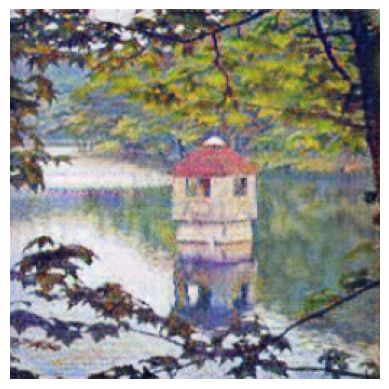

Time for epoch 5: 10 min 6 sec
Epoch 6/200
......................................................................
G Loss: 4.7081, D Photo Loss: 0.2042, D Monet Loss: 0.1730
Time for epoch 6: 10 min 1 sec
Epoch 7/200
......................................................................
G Loss: 4.5661, D Photo Loss: 0.2014, D Monet Loss: 0.1646
Time for epoch 7: 10 min 4 sec
Epoch 8/200
......................................................................
G Loss: 4.5829, D Photo Loss: 0.1997, D Monet Loss: 0.1602
No improvement in G Loss. Patience: 1/200
Time for epoch 8: 9 min 45 sec
Epoch 9/200
......................................................................
G Loss: 4.5506, D Photo Loss: 0.2015, D Monet Loss: 0.1581
Time for epoch 9: 9 min 59 sec
Epoch 10/200
......................................................................
G Loss: 4.5271, D Photo Loss: 0.2005, D Monet Loss: 0.1542


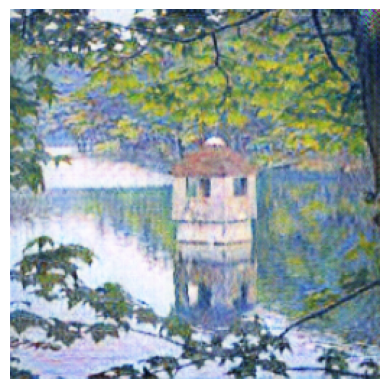

Time for epoch 10: 9 min 45 sec
Epoch 11/200
......................................................................
G Loss: 4.4390, D Photo Loss: 0.1992, D Monet Loss: 0.1481
Time for epoch 11: 10 min 24 sec
Epoch 12/200
......................................................................
G Loss: 4.4158, D Photo Loss: 0.1999, D Monet Loss: 0.1480
Time for epoch 12: 9 min 54 sec
Epoch 13/200
......................................................................
G Loss: 4.3965, D Photo Loss: 0.2009, D Monet Loss: 0.1449
Time for epoch 13: 10 min 15 sec
Epoch 14/200
......................................................................
G Loss: 4.3848, D Photo Loss: 0.2012, D Monet Loss: 0.1426
Time for epoch 14: 10 min 2 sec
Epoch 15/200
......................................................................
G Loss: 4.3951, D Photo Loss: 0.2009, D Monet Loss: 0.1424
No improvement in G Loss. Patience: 1/200


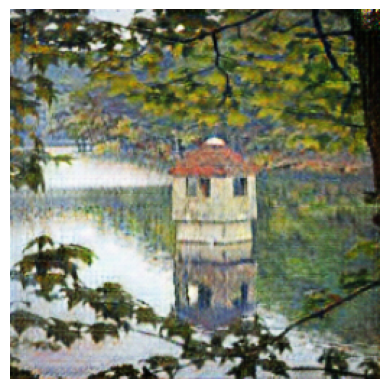

Time for epoch 15: 10 min 34 sec
Epoch 16/200
......................................................................
G Loss: 4.3299, D Photo Loss: 0.1964, D Monet Loss: 0.1329
Time for epoch 16: 10 min 0 sec
Epoch 17/200
......................................................................
G Loss: 4.3129, D Photo Loss: 0.1979, D Monet Loss: 0.1318
Time for epoch 17: 10 min 10 sec
Epoch 18/200
......................................................................
G Loss: 4.2465, D Photo Loss: 0.1957, D Monet Loss: 0.1227
Time for epoch 18: 10 min 2 sec
Epoch 19/200
......................................................................
G Loss: 4.3291, D Photo Loss: 0.1989, D Monet Loss: 0.1289
No improvement in G Loss. Patience: 1/200
Time for epoch 19: 9 min 52 sec
Epoch 20/200
......................................................................
G Loss: 4.2932, D Photo Loss: 0.1971, D Monet Loss: 0.1250
No improvement in G Loss. Patience: 2/200


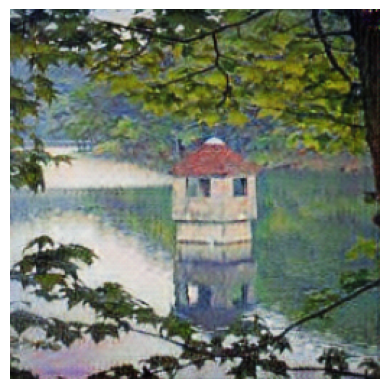

Time for epoch 20: 9 min 58 sec
Epoch 21/200
......................................................................
G Loss: 4.2369, D Photo Loss: 0.1978, D Monet Loss: 0.1199
Time for epoch 21: 10 min 37 sec
Epoch 22/200
......................................................................
G Loss: 4.2448, D Photo Loss: 0.1971, D Monet Loss: 0.1196
No improvement in G Loss. Patience: 1/200
Time for epoch 22: 9 min 40 sec
Epoch 23/200
......................................................................
G Loss: 4.2293, D Photo Loss: 0.1969, D Monet Loss: 0.1177
Time for epoch 23: 10 min 40 sec
Epoch 24/200
......................................................................
G Loss: 4.2427, D Photo Loss: 0.1956, D Monet Loss: 0.1161
No improvement in G Loss. Patience: 1/200
Time for epoch 24: 10 min 5 sec
Epoch 25/200
......................................................................
G Loss: 4.1626, D Photo Loss: 0.1896, D Monet Loss: 0.1084


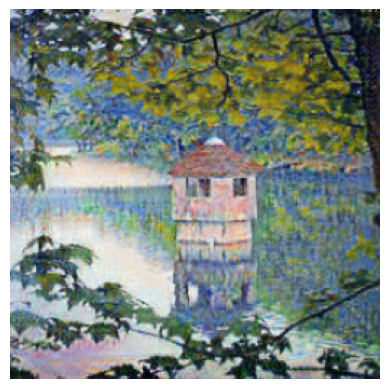

Time for epoch 25: 9 min 53 sec
Epoch 26/200
......................................................................
G Loss: 4.2325, D Photo Loss: 0.1900, D Monet Loss: 0.1143
No improvement in G Loss. Patience: 1/200
Time for epoch 26: 10 min 6 sec
Epoch 27/200
......................................................................
G Loss: 4.2001, D Photo Loss: 0.1825, D Monet Loss: 0.1062
No improvement in G Loss. Patience: 2/200
Time for epoch 27: 9 min 45 sec
Epoch 28/200
......................................................................
G Loss: 4.2044, D Photo Loss: 0.1765, D Monet Loss: 0.1057
No improvement in G Loss. Patience: 3/200
Time for epoch 28: 10 min 25 sec
Epoch 29/200
......................................................................
G Loss: 4.2602, D Photo Loss: 0.1725, D Monet Loss: 0.1080
No improvement in G Loss. Patience: 4/200
Time for epoch 29: 9 min 51 sec
Epoch 30/200
......................................................................
G Loss: 4.2483,

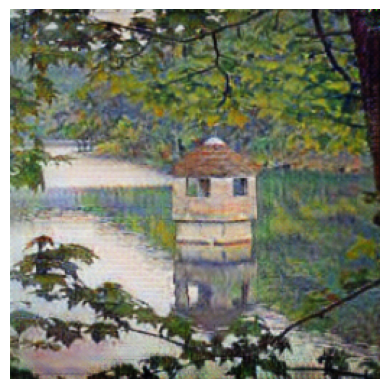

Time for epoch 30: 9 min 50 sec
Epoch 31/200
......................................................................
G Loss: 4.2343, D Photo Loss: 0.1628, D Monet Loss: 0.1049
No improvement in G Loss. Patience: 6/200
Time for epoch 31: 9 min 47 sec
Epoch 32/200
......................................................................
G Loss: 4.2283, D Photo Loss: 0.1587, D Monet Loss: 0.0999
No improvement in G Loss. Patience: 7/200
Time for epoch 32: 9 min 49 sec
Epoch 33/200
......................................................................
G Loss: 4.2566, D Photo Loss: 0.1604, D Monet Loss: 0.1054
No improvement in G Loss. Patience: 8/200
Time for epoch 33: 9 min 54 sec
Epoch 34/200
......................................................................
G Loss: 4.2078, D Photo Loss: 0.1560, D Monet Loss: 0.0974
No improvement in G Loss. Patience: 9/200
Time for epoch 34: 10 min 17 sec
Epoch 35/200
......................................................................
G Loss: 4.2492,

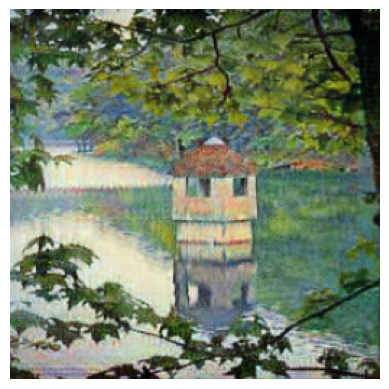

Time for epoch 35: 10 min 5 sec
Epoch 36/200
......................................................................
G Loss: 4.1045, D Photo Loss: 0.1488, D Monet Loss: 0.0854
Time for epoch 36: 10 min 12 sec
Epoch 37/200
......................................................................
G Loss: 4.1983, D Photo Loss: 0.1575, D Monet Loss: 0.0952
No improvement in G Loss. Patience: 1/200
Time for epoch 37: 9 min 58 sec
Epoch 38/200
......................................................................
G Loss: 4.1687, D Photo Loss: 0.1575, D Monet Loss: 0.0937
No improvement in G Loss. Patience: 2/200
Time for epoch 38: 10 min 12 sec
Epoch 39/200
......................................................................
G Loss: 4.1788, D Photo Loss: 0.1587, D Monet Loss: 0.0954
No improvement in G Loss. Patience: 3/200
Time for epoch 39: 10 min 2 sec
Epoch 40/200
......................................................................
G Loss: 4.1839, D Photo Loss: 0.1592, D Monet Loss: 0.09

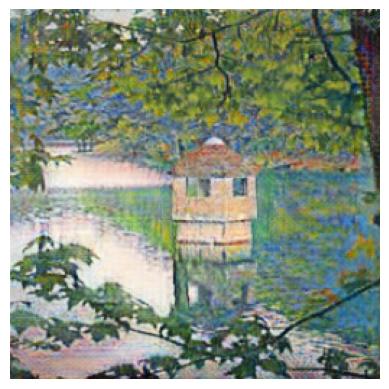

Time for epoch 40: 10 min 10 sec
Epoch 41/200
......................................................................
G Loss: 4.1234, D Photo Loss: 0.1518, D Monet Loss: 0.0856
No improvement in G Loss. Patience: 5/200
Time for epoch 41: 10 min 13 sec
Epoch 42/200
......................................................................
G Loss: 4.1700, D Photo Loss: 0.1548, D Monet Loss: 0.0952
No improvement in G Loss. Patience: 6/200
Time for epoch 42: 10 min 3 sec
Epoch 43/200
......................................................................
G Loss: 4.1330, D Photo Loss: 0.1479, D Monet Loss: 0.0859
No improvement in G Loss. Patience: 7/200
Time for epoch 43: 10 min 8 sec
Epoch 44/200
......................................................................
G Loss: 4.1946, D Photo Loss: 0.1534, D Monet Loss: 0.0929
No improvement in G Loss. Patience: 8/200
Time for epoch 44: 9 min 58 sec
Epoch 45/200
......................................................................
G Loss: 4.1446

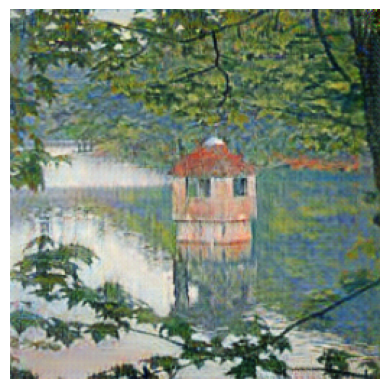

Time for epoch 45: 10 min 45 sec
Epoch 46/200
......................................................................
G Loss: 4.1309, D Photo Loss: 0.1478, D Monet Loss: 0.0864
No improvement in G Loss. Patience: 10/200
Time for epoch 46: 9 min 58 sec
Epoch 47/200
......................................................................
G Loss: 4.1321, D Photo Loss: 0.1493, D Monet Loss: 0.0858
No improvement in G Loss. Patience: 11/200
Time for epoch 47: 10 min 27 sec
Epoch 48/200
......................................................................
G Loss: 4.1207, D Photo Loss: 0.1498, D Monet Loss: 0.0855
No improvement in G Loss. Patience: 12/200
Time for epoch 48: 10 min 30 sec
Epoch 49/200
......................................................................
G Loss: 4.1258, D Photo Loss: 0.1480, D Monet Loss: 0.0840
No improvement in G Loss. Patience: 13/200
Time for epoch 49: 9 min 59 sec
Epoch 50/200
......................................................................
G Loss: 4

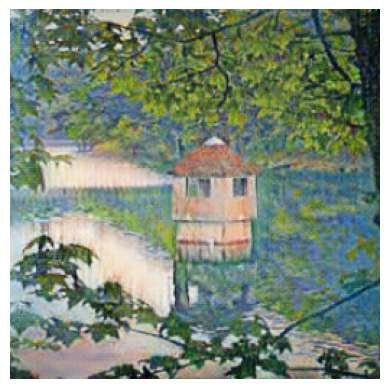

Time for epoch 50: 10 min 33 sec
Epoch 51/200
......................................................................
G Loss: 4.0762, D Photo Loss: 0.1479, D Monet Loss: 0.0804
Time for epoch 51: 10 min 24 sec
Epoch 52/200
......................................................................
G Loss: 4.1153, D Photo Loss: 0.1501, D Monet Loss: 0.0839
No improvement in G Loss. Patience: 1/200
Time for epoch 52: 10 min 15 sec
Epoch 53/200
......................................................................
G Loss: 4.0651, D Photo Loss: 0.1497, D Monet Loss: 0.0796
Time for epoch 53: 10 min 7 sec
Epoch 54/200
......................................................................
G Loss: 4.0966, D Photo Loss: 0.1502, D Monet Loss: 0.0792
No improvement in G Loss. Patience: 1/200
Time for epoch 54: 10 min 2 sec
Epoch 55/200
......................................................................
G Loss: 4.0807, D Photo Loss: 0.1534, D Monet Loss: 0.0821
No improvement in G Loss. Patience: 2/

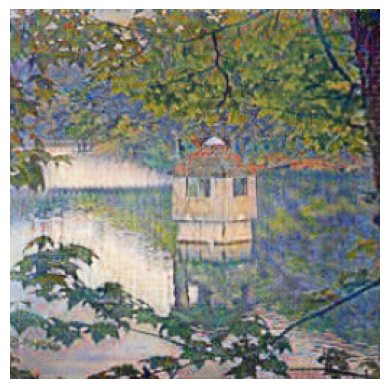

Time for epoch 55: 9 min 43 sec
Epoch 56/200
......................................................................
G Loss: 4.0577, D Photo Loss: 0.1545, D Monet Loss: 0.0790
Time for epoch 56: 10 min 10 sec
Epoch 57/200
......................................................................
G Loss: 4.0596, D Photo Loss: 0.1552, D Monet Loss: 0.0803
No improvement in G Loss. Patience: 1/200
Time for epoch 57: 10 min 5 sec
Epoch 58/200
......................................................................
G Loss: 4.0269, D Photo Loss: 0.1545, D Monet Loss: 0.0767
Time for epoch 58: 10 min 22 sec
Epoch 59/200
......................................................................
G Loss: 4.0240, D Photo Loss: 0.1551, D Monet Loss: 0.0779
Time for epoch 59: 9 min 50 sec
Epoch 60/200
......................................................................
G Loss: 4.0739, D Photo Loss: 0.1583, D Monet Loss: 0.0818
No improvement in G Loss. Patience: 1/200


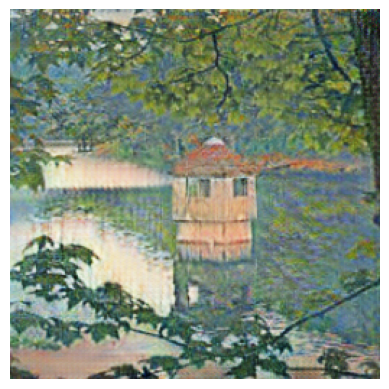

Time for epoch 60: 9 min 50 sec
Epoch 61/200
......................................................................
G Loss: 4.0111, D Photo Loss: 0.1564, D Monet Loss: 0.0750
Time for epoch 61: 10 min 32 sec
Epoch 62/200
......................................................................
G Loss: 4.0148, D Photo Loss: 0.1574, D Monet Loss: 0.0749
No improvement in G Loss. Patience: 1/200
Time for epoch 62: 10 min 7 sec
Epoch 63/200
......................................................................
G Loss: 4.0129, D Photo Loss: 0.1577, D Monet Loss: 0.0774
No improvement in G Loss. Patience: 2/200
Time for epoch 63: 9 min 35 sec
Epoch 64/200
......................................................................
G Loss: 4.0218, D Photo Loss: 0.1581, D Monet Loss: 0.0771
No improvement in G Loss. Patience: 3/200
Time for epoch 64: 10 min 13 sec
Epoch 65/200
......................................................................
G Loss: 3.9992, D Photo Loss: 0.1568, D Monet Loss: 0.07

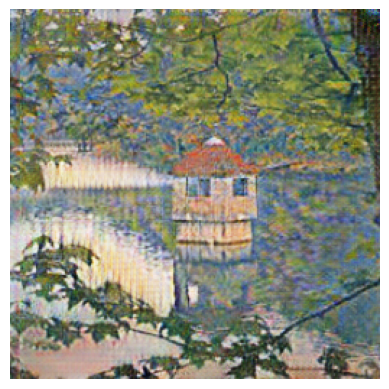

Time for epoch 65: 10 min 11 sec
Epoch 66/200
......................................................................
G Loss: 3.9965, D Photo Loss: 0.1564, D Monet Loss: 0.0756
Time for epoch 66: 10 min 12 sec
Epoch 67/200
......................................................................
G Loss: 3.9571, D Photo Loss: 0.1541, D Monet Loss: 0.0709
Time for epoch 67: 9 min 50 sec
Epoch 68/200
......................................................................
G Loss: 4.0177, D Photo Loss: 0.1579, D Monet Loss: 0.0760
No improvement in G Loss. Patience: 1/200
Time for epoch 68: 10 min 27 sec
Epoch 69/200
......................................................................
G Loss: 3.9554, D Photo Loss: 0.1545, D Monet Loss: 0.0716
Time for epoch 69: 10 min 6 sec
Epoch 70/200
......................................................................
G Loss: 3.9818, D Photo Loss: 0.1561, D Monet Loss: 0.0730
No improvement in G Loss. Patience: 1/200


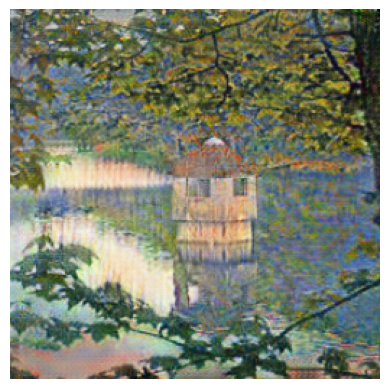

Time for epoch 70: 10 min 26 sec
Epoch 71/200
......................................................................
G Loss: 3.9874, D Photo Loss: 0.1572, D Monet Loss: 0.0746
No improvement in G Loss. Patience: 2/200
Time for epoch 71: 10 min 9 sec
Epoch 72/200
......................................................................
G Loss: 3.9364, D Photo Loss: 0.1544, D Monet Loss: 0.0683
Time for epoch 72: 9 min 41 sec
Epoch 73/200
......................................................................
G Loss: 3.9940, D Photo Loss: 0.1582, D Monet Loss: 0.0752
No improvement in G Loss. Patience: 1/200
Time for epoch 73: 10 min 30 sec
Epoch 74/200
......................................................................
G Loss: 3.9410, D Photo Loss: 0.1547, D Monet Loss: 0.0689
No improvement in G Loss. Patience: 2/200
Time for epoch 74: 9 min 57 sec
Epoch 75/200
......................................................................
G Loss: 3.9464, D Photo Loss: 0.1575, D Monet Loss: 0.07

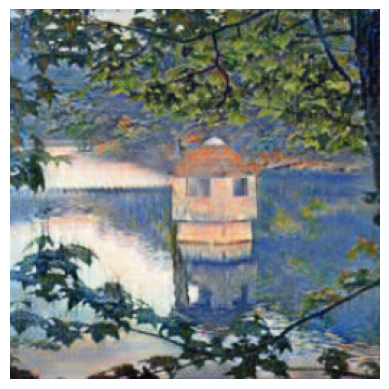

Time for epoch 75: 9 min 42 sec
Epoch 76/200
......................................................................
G Loss: 3.9388, D Photo Loss: 0.1567, D Monet Loss: 0.0696
No improvement in G Loss. Patience: 4/200
Time for epoch 76: 10 min 14 sec
Epoch 77/200
......................................................................
G Loss: 3.9552, D Photo Loss: 0.1584, D Monet Loss: 0.0727
No improvement in G Loss. Patience: 5/200
Time for epoch 77: 10 min 2 sec
Epoch 78/200
......................................................................
G Loss: 3.9103, D Photo Loss: 0.1557, D Monet Loss: 0.0658
Time for epoch 78: 10 min 2 sec
Epoch 79/200
......................................................................
G Loss: 3.9346, D Photo Loss: 0.1583, D Monet Loss: 0.0706
No improvement in G Loss. Patience: 1/200
Time for epoch 79: 9 min 45 sec
Epoch 80/200
......................................................................
G Loss: 3.9313, D Photo Loss: 0.1593, D Monet Loss: 0.068

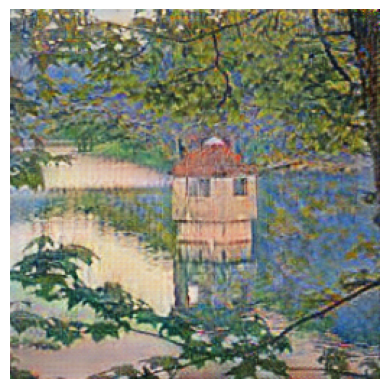

Time for epoch 80: 10 min 21 sec
Epoch 81/200
......................................................................
G Loss: 3.9135, D Photo Loss: 0.1609, D Monet Loss: 0.0682
No improvement in G Loss. Patience: 3/200
Time for epoch 81: 9 min 51 sec
Epoch 82/200
......................................................................
G Loss: 3.9430, D Photo Loss: 0.1630, D Monet Loss: 0.0726
No improvement in G Loss. Patience: 4/200
Time for epoch 82: 9 min 56 sec
Epoch 83/200
......................................................................
G Loss: 3.8947, D Photo Loss: 0.1600, D Monet Loss: 0.0668
Time for epoch 83: 10 min 31 sec
Epoch 84/200
......................................................................
G Loss: 3.8834, D Photo Loss: 0.1605, D Monet Loss: 0.0649
Time for epoch 84: 10 min 36 sec
Epoch 85/200
......................................................................
G Loss: 3.9100, D Photo Loss: 0.1623, D Monet Loss: 0.0673
No improvement in G Loss. Patience: 1/

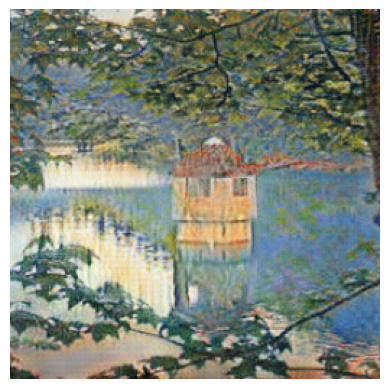

Time for epoch 85: 10 min 5 sec
Epoch 86/200
......................................................................
G Loss: 3.8879, D Photo Loss: 0.1621, D Monet Loss: 0.0683
No improvement in G Loss. Patience: 2/200
Time for epoch 86: 10 min 10 sec
Epoch 87/200
......................................................................
G Loss: 3.9035, D Photo Loss: 0.1628, D Monet Loss: 0.0669
No improvement in G Loss. Patience: 3/200
Time for epoch 87: 10 min 1 sec
Epoch 88/200
......................................................................
G Loss: 3.8890, D Photo Loss: 0.1639, D Monet Loss: 0.0673
No improvement in G Loss. Patience: 4/200
Time for epoch 88: 10 min 12 sec
Epoch 89/200
......................................................................
G Loss: 3.8901, D Photo Loss: 0.1634, D Monet Loss: 0.0672
No improvement in G Loss. Patience: 5/200
Time for epoch 89: 10 min 45 sec
Epoch 90/200
......................................................................
G Loss: 3.856

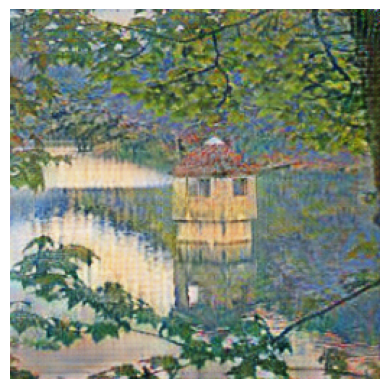

Time for epoch 90: 10 min 21 sec
Epoch 91/200
......................................................................
G Loss: 3.8644, D Photo Loss: 0.1640, D Monet Loss: 0.0640
No improvement in G Loss. Patience: 1/200
Time for epoch 91: 10 min 27 sec
Epoch 92/200
......................................................................
G Loss: 3.8615, D Photo Loss: 0.1655, D Monet Loss: 0.0661
No improvement in G Loss. Patience: 2/200
Time for epoch 92: 9 min 34 sec
Epoch 93/200
......................................................................
G Loss: 3.8800, D Photo Loss: 0.1661, D Monet Loss: 0.0675
No improvement in G Loss. Patience: 3/200
Time for epoch 93: 10 min 17 sec
Epoch 94/200
......................................................................
G Loss: 3.8605, D Photo Loss: 0.1653, D Monet Loss: 0.0647
No improvement in G Loss. Patience: 4/200
Time for epoch 94: 10 min 7 sec
Epoch 95/200
......................................................................
G Loss: 3.860

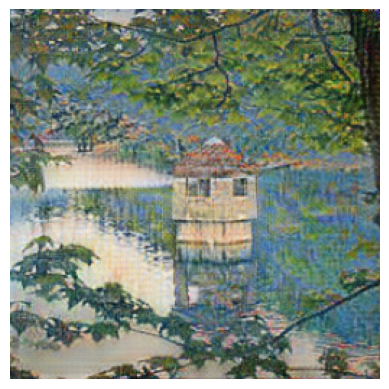

Time for epoch 95: 9 min 54 sec
Epoch 96/200
......................................................................
G Loss: 3.8366, D Photo Loss: 0.1653, D Monet Loss: 0.0634
Time for epoch 96: 10 min 10 sec
Epoch 97/200
......................................................................
G Loss: 3.8491, D Photo Loss: 0.1651, D Monet Loss: 0.0644
No improvement in G Loss. Patience: 1/200
Time for epoch 97: 9 min 59 sec
Epoch 98/200
......................................................................
G Loss: 3.8074, D Photo Loss: 0.1639, D Monet Loss: 0.0612
Time for epoch 98: 10 min 13 sec
Epoch 99/200
......................................................................
G Loss: 3.8455, D Photo Loss: 0.1674, D Monet Loss: 0.0647
No improvement in G Loss. Patience: 1/200
Time for epoch 99: 9 min 48 sec
Epoch 100/200
......................................................................
G Loss: 3.8263, D Photo Loss: 0.1661, D Monet Loss: 0.0648
No improvement in G Loss. Patience: 2/

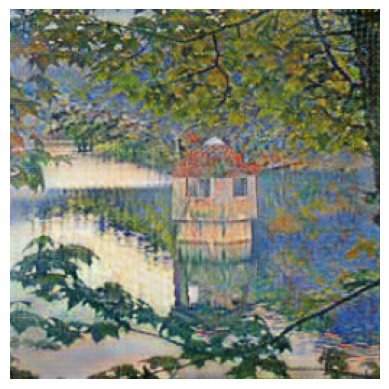

Time for epoch 100: 10 min 20 sec
Epoch 101/200
......................................................................
G Loss: 3.8158, D Photo Loss: 0.1658, D Monet Loss: 0.0611
No improvement in G Loss. Patience: 3/200
Time for epoch 101: 9 min 37 sec
Epoch 102/200
......................................................................
G Loss: 3.8276, D Photo Loss: 0.1659, D Monet Loss: 0.0636
No improvement in G Loss. Patience: 4/200
Time for epoch 102: 9 min 52 sec
Epoch 103/200
......................................................................
G Loss: 3.7873, D Photo Loss: 0.1650, D Monet Loss: 0.0603
Time for epoch 103: 10 min 10 sec
Epoch 104/200
......................................................................
G Loss: 3.8339, D Photo Loss: 0.1671, D Monet Loss: 0.0633
No improvement in G Loss. Patience: 1/200
Time for epoch 104: 10 min 24 sec
Epoch 105/200
......................................................................
G Loss: 3.8050, D Photo Loss: 0.1667, D Monet

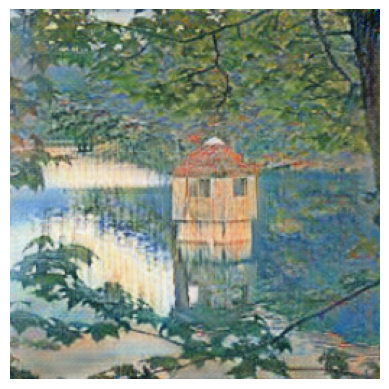

Time for epoch 105: 10 min 11 sec
Epoch 106/200
......................................................................
G Loss: 3.7939, D Photo Loss: 0.1662, D Monet Loss: 0.0596
No improvement in G Loss. Patience: 3/200
Time for epoch 106: 10 min 5 sec
Epoch 107/200
......................................................................
G Loss: 3.7993, D Photo Loss: 0.1659, D Monet Loss: 0.0604
No improvement in G Loss. Patience: 4/200
Time for epoch 107: 9 min 57 sec
Epoch 108/200
......................................................................
G Loss: 3.7906, D Photo Loss: 0.1665, D Monet Loss: 0.0604
No improvement in G Loss. Patience: 5/200
Time for epoch 108: 10 min 17 sec
Epoch 109/200
......................................................................
G Loss: 3.7798, D Photo Loss: 0.1664, D Monet Loss: 0.0595
Time for epoch 109: 9 min 43 sec
Epoch 110/200
......................................................................
G Loss: 3.7205, D Photo Loss: 0.1642, D Monet 

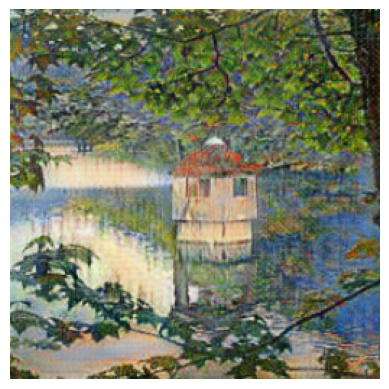

Time for epoch 110: 10 min 19 sec
Epoch 111/200
......................................................................
G Loss: 3.7560, D Photo Loss: 0.1660, D Monet Loss: 0.0577
No improvement in G Loss. Patience: 1/200
Time for epoch 111: 9 min 49 sec
Epoch 112/200
......................................................................
G Loss: 3.7586, D Photo Loss: 0.1639, D Monet Loss: 0.0578
No improvement in G Loss. Patience: 2/200
Time for epoch 112: 10 min 5 sec
Epoch 113/200
......................................................................
G Loss: 3.7391, D Photo Loss: 0.1661, D Monet Loss: 0.0558
No improvement in G Loss. Patience: 3/200
Time for epoch 113: 10 min 23 sec
Epoch 114/200
......................................................................
G Loss: 3.7847, D Photo Loss: 0.1690, D Monet Loss: 0.0598
No improvement in G Loss. Patience: 4/200
Time for epoch 114: 10 min 16 sec
Epoch 115/200
......................................................................
G L

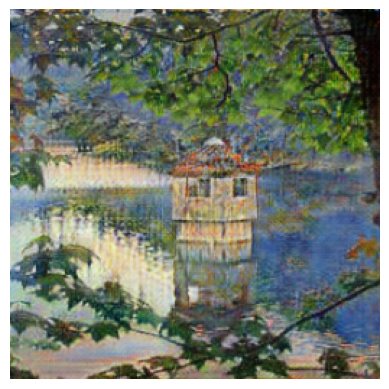

Time for epoch 115: 10 min 3 sec
Epoch 116/200
......................................................................
G Loss: 3.7192, D Photo Loss: 0.1657, D Monet Loss: 0.0551
Time for epoch 116: 9 min 60 sec
Epoch 117/200
......................................................................
G Loss: 3.7489, D Photo Loss: 0.1691, D Monet Loss: 0.0572
No improvement in G Loss. Patience: 1/200
Time for epoch 117: 10 min 14 sec
Epoch 118/200
......................................................................
G Loss: 3.7399, D Photo Loss: 0.1661, D Monet Loss: 0.0562
No improvement in G Loss. Patience: 2/200
Time for epoch 118: 9 min 60 sec
Epoch 119/200
......................................................................
G Loss: 3.6715, D Photo Loss: 0.1652, D Monet Loss: 0.0498
Time for epoch 119: 10 min 12 sec
Epoch 120/200
......................................................................
G Loss: 3.7142, D Photo Loss: 0.1670, D Monet Loss: 0.0545
No improvement in G Loss. Pat

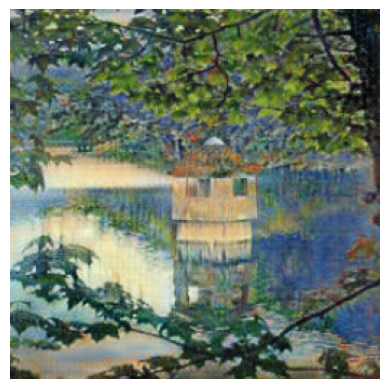

Time for epoch 120: 10 min 5 sec
Epoch 121/200
......................................................................
G Loss: 3.7176, D Photo Loss: 0.1654, D Monet Loss: 0.0541
No improvement in G Loss. Patience: 2/200
Time for epoch 121: 10 min 11 sec
Epoch 122/200
......................................................................
G Loss: 3.7223, D Photo Loss: 0.1668, D Monet Loss: 0.0531
No improvement in G Loss. Patience: 3/200
Time for epoch 122: 10 min 23 sec
Epoch 123/200
......................................................................
G Loss: 3.6773, D Photo Loss: 0.1650, D Monet Loss: 0.0513
No improvement in G Loss. Patience: 4/200
Time for epoch 123: 10 min 6 sec
Epoch 124/200
......................................................................
G Loss: 3.6870, D Photo Loss: 0.1675, D Monet Loss: 0.0522
No improvement in G Loss. Patience: 5/200
Time for epoch 124: 9 min 59 sec
Epoch 125/200
......................................................................
G Lo

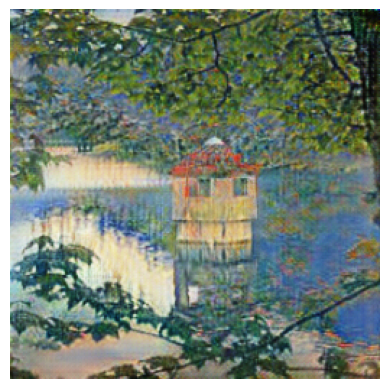

Time for epoch 125: 9 min 54 sec
Epoch 126/200
......................................................................
G Loss: 3.6751, D Photo Loss: 0.1679, D Monet Loss: 0.0515
No improvement in G Loss. Patience: 7/200
Time for epoch 126: 10 min 12 sec
Epoch 127/200
......................................................................
G Loss: 3.6542, D Photo Loss: 0.1667, D Monet Loss: 0.0493
Time for epoch 127: 10 min 7 sec
Epoch 128/200
......................................................................
G Loss: 3.6754, D Photo Loss: 0.1658, D Monet Loss: 0.0517
No improvement in G Loss. Patience: 1/200
Time for epoch 128: 10 min 30 sec
Epoch 129/200
......................................................................
G Loss: 3.6740, D Photo Loss: 0.1671, D Monet Loss: 0.0511
No improvement in G Loss. Patience: 2/200
Time for epoch 129: 10 min 2 sec
Epoch 130/200
......................................................................
G Loss: 3.6555, D Photo Loss: 0.1646, D Monet 

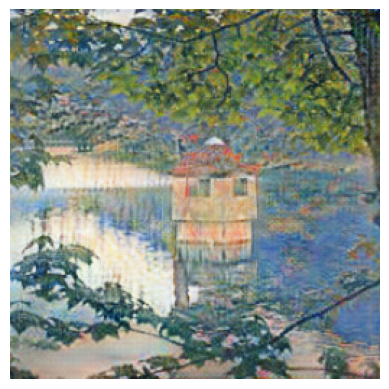

Time for epoch 130: 10 min 0 sec
Epoch 131/200
......................................................................
G Loss: 3.6407, D Photo Loss: 0.1659, D Monet Loss: 0.0489
Time for epoch 131: 9 min 55 sec
Epoch 132/200
......................................................................
G Loss: 3.6509, D Photo Loss: 0.1654, D Monet Loss: 0.0485
No improvement in G Loss. Patience: 1/200
Time for epoch 132: 9 min 59 sec
Epoch 133/200
......................................................................
G Loss: 3.6487, D Photo Loss: 0.1654, D Monet Loss: 0.0495
No improvement in G Loss. Patience: 2/200
Time for epoch 133: 9 min 58 sec
Epoch 134/200
......................................................................
G Loss: 3.6440, D Photo Loss: 0.1640, D Monet Loss: 0.0494
No improvement in G Loss. Patience: 3/200
Time for epoch 134: 10 min 1 sec
Epoch 135/200
......................................................................
G Loss: 3.6340, D Photo Loss: 0.1635, D Monet Lo

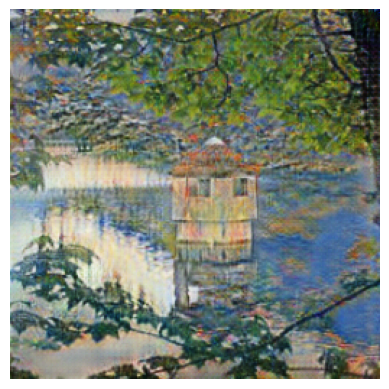

Time for epoch 135: 10 min 5 sec
Epoch 136/200
......................................................................
G Loss: 3.6189, D Photo Loss: 0.1619, D Monet Loss: 0.0465
Time for epoch 136: 9 min 53 sec
Epoch 137/200
......................................................................
G Loss: 3.6282, D Photo Loss: 0.1624, D Monet Loss: 0.0470
No improvement in G Loss. Patience: 1/200
Time for epoch 137: 9 min 48 sec
Epoch 138/200
......................................................................
G Loss: 3.6511, D Photo Loss: 0.1629, D Monet Loss: 0.0488
No improvement in G Loss. Patience: 2/200
Time for epoch 138: 10 min 5 sec
Epoch 139/200
......................................................................
G Loss: 3.6346, D Photo Loss: 0.1591, D Monet Loss: 0.0472
No improvement in G Loss. Patience: 3/200
Time for epoch 139: 9 min 27 sec
Epoch 140/200
......................................................................
G Loss: 3.6397, D Photo Loss: 0.1586, D Monet Lo

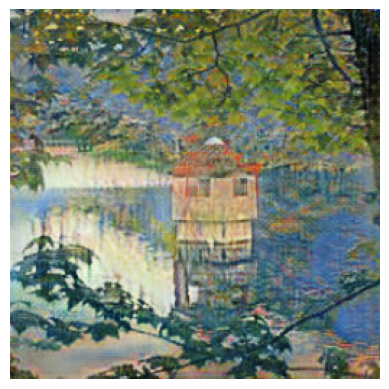

Time for epoch 140: 10 min 2 sec
Epoch 141/200
......................................................................
G Loss: 3.6302, D Photo Loss: 0.1575, D Monet Loss: 0.0456
No improvement in G Loss. Patience: 5/200
Time for epoch 141: 10 min 16 sec
Epoch 142/200
......................................................................
G Loss: 3.6580, D Photo Loss: 0.1550, D Monet Loss: 0.0465
No improvement in G Loss. Patience: 6/200
Time for epoch 142: 10 min 13 sec
Epoch 143/200
......................................................................
G Loss: 3.6372, D Photo Loss: 0.1524, D Monet Loss: 0.0454
No improvement in G Loss. Patience: 7/200
Time for epoch 143: 10 min 12 sec
Epoch 144/200
......................................................................
G Loss: 3.6513, D Photo Loss: 0.1487, D Monet Loss: 0.0466
No improvement in G Loss. Patience: 8/200
Time for epoch 144: 9 min 58 sec
Epoch 145/200
......................................................................
G L

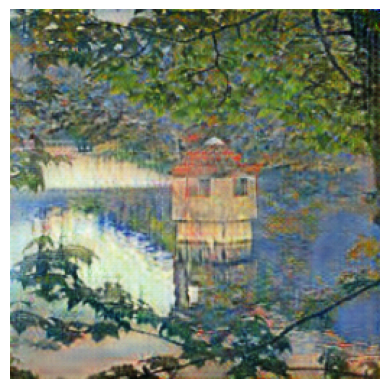

Time for epoch 145: 10 min 17 sec
Epoch 146/200
......................................................................
G Loss: 3.6580, D Photo Loss: 0.1409, D Monet Loss: 0.0442
No improvement in G Loss. Patience: 10/200
Time for epoch 146: 10 min 35 sec
Epoch 147/200
......................................................................
G Loss: 3.6473, D Photo Loss: 0.1392, D Monet Loss: 0.0445
No improvement in G Loss. Patience: 11/200
Time for epoch 147: 9 min 59 sec
Epoch 148/200
......................................................................
G Loss: 3.6877, D Photo Loss: 0.1365, D Monet Loss: 0.0462
No improvement in G Loss. Patience: 12/200
Time for epoch 148: 10 min 6 sec
Epoch 149/200
......................................................................
G Loss: 3.6671, D Photo Loss: 0.1344, D Monet Loss: 0.0433
No improvement in G Loss. Patience: 13/200
Time for epoch 149: 10 min 27 sec
Epoch 150/200
......................................................................

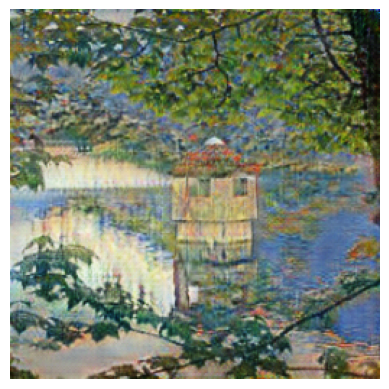

Time for epoch 150: 10 min 41 sec
Epoch 151/200
......................................................................
G Loss: 3.6677, D Photo Loss: 0.1314, D Monet Loss: 0.0433
No improvement in G Loss. Patience: 15/200
Time for epoch 151: 9 min 57 sec
Epoch 152/200
......................................................................
G Loss: 3.6606, D Photo Loss: 0.1297, D Monet Loss: 0.0430
No improvement in G Loss. Patience: 16/200
Time for epoch 152: 10 min 30 sec
Epoch 153/200
......................................................................
G Loss: 3.6693, D Photo Loss: 0.1291, D Monet Loss: 0.0431
No improvement in G Loss. Patience: 17/200
Time for epoch 153: 10 min 13 sec
Epoch 154/200
......................................................................
G Loss: 3.6590, D Photo Loss: 0.1289, D Monet Loss: 0.0426
No improvement in G Loss. Patience: 18/200
Time for epoch 154: 9 min 43 sec
Epoch 155/200
......................................................................

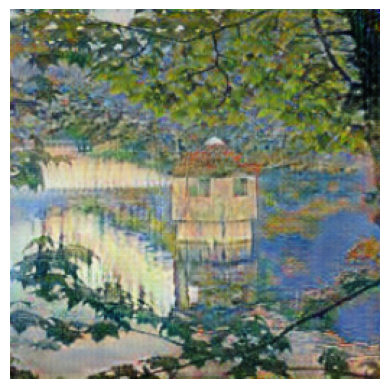

Time for epoch 155: 9 min 50 sec
Epoch 156/200
......................................................................
G Loss: 3.6524, D Photo Loss: 0.1276, D Monet Loss: 0.0422
No improvement in G Loss. Patience: 20/200
Time for epoch 156: 10 min 47 sec
Epoch 157/200
......................................................................
G Loss: 3.6114, D Photo Loss: 0.1271, D Monet Loss: 0.0402
Time for epoch 157: 9 min 60 sec
Epoch 158/200
......................................................................
G Loss: 3.6498, D Photo Loss: 0.1263, D Monet Loss: 0.0424
No improvement in G Loss. Patience: 1/200
Time for epoch 158: 10 min 3 sec
Epoch 159/200
......................................................................
G Loss: 3.6546, D Photo Loss: 0.1248, D Monet Loss: 0.0413
No improvement in G Loss. Patience: 2/200
Time for epoch 159: 10 min 7 sec
Epoch 160/200
......................................................................
G Loss: 3.6404, D Photo Loss: 0.1261, D Monet 

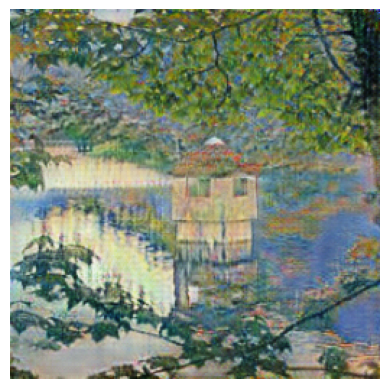

Time for epoch 160: 10 min 9 sec
Epoch 161/200
......................................................................
G Loss: 3.6391, D Photo Loss: 0.1261, D Monet Loss: 0.0416
No improvement in G Loss. Patience: 4/200
Time for epoch 161: 10 min 24 sec
Epoch 162/200
......................................................................
G Loss: 3.6398, D Photo Loss: 0.1258, D Monet Loss: 0.0406
No improvement in G Loss. Patience: 5/200
Time for epoch 162: 9 min 58 sec
Epoch 163/200
......................................................................
G Loss: 3.6525, D Photo Loss: 0.1245, D Monet Loss: 0.0407
No improvement in G Loss. Patience: 6/200
Time for epoch 163: 10 min 29 sec
Epoch 164/200
......................................................................
G Loss: 3.6172, D Photo Loss: 0.1253, D Monet Loss: 0.0400
No improvement in G Loss. Patience: 7/200
Time for epoch 164: 10 min 27 sec
Epoch 165/200
......................................................................
G L

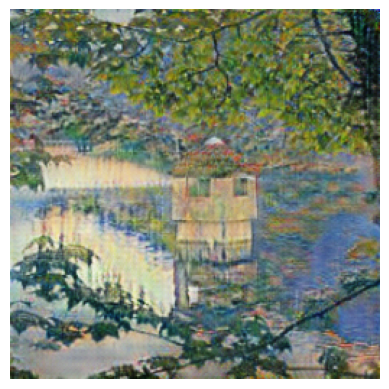

Time for epoch 165: 10 min 4 sec
Epoch 166/200
......................................................................
G Loss: 3.6191, D Photo Loss: 0.1243, D Monet Loss: 0.0391
No improvement in G Loss. Patience: 1/200
Time for epoch 166: 10 min 35 sec
Epoch 167/200
......................................................................
G Loss: 3.6024, D Photo Loss: 0.1257, D Monet Loss: 0.0393
No improvement in G Loss. Patience: 2/200
Time for epoch 167: 9 min 49 sec
Epoch 168/200
......................................................................
G Loss: 3.6146, D Photo Loss: 0.1252, D Monet Loss: 0.0392
No improvement in G Loss. Patience: 3/200
Time for epoch 168: 10 min 24 sec
Epoch 169/200
......................................................................
G Loss: 3.6142, D Photo Loss: 0.1252, D Monet Loss: 0.0392
No improvement in G Loss. Patience: 4/200
Time for epoch 169: 10 min 7 sec
Epoch 170/200
......................................................................
G Lo

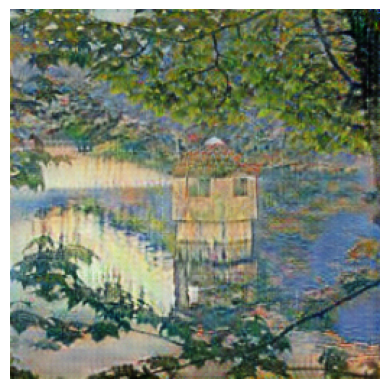

Time for epoch 170: 9 min 49 sec
Epoch 171/200
......................................................................
G Loss: 3.6006, D Photo Loss: 0.1258, D Monet Loss: 0.0389
No improvement in G Loss. Patience: 1/200
Time for epoch 171: 9 min 49 sec
Epoch 172/200
......................................................................
G Loss: 3.5962, D Photo Loss: 0.1256, D Monet Loss: 0.0379
No improvement in G Loss. Patience: 2/200
Time for epoch 172: 9 min 54 sec
Epoch 173/200
......................................................................
G Loss: 3.5959, D Photo Loss: 0.1252, D Monet Loss: 0.0381
No improvement in G Loss. Patience: 3/200
Time for epoch 173: 9 min 39 sec
Epoch 174/200
......................................................................
G Loss: 3.5824, D Photo Loss: 0.1251, D Monet Loss: 0.0379
No improvement in G Loss. Patience: 4/200
Time for epoch 174: 10 min 21 sec
Epoch 175/200
......................................................................
G Los

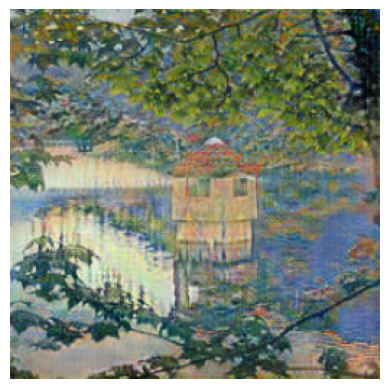

Time for epoch 175: 9 min 51 sec
Epoch 176/200
......................................................................
G Loss: 3.5703, D Photo Loss: 0.1260, D Monet Loss: 0.0375
Time for epoch 176: 10 min 48 sec
Epoch 177/200
......................................................................
G Loss: 3.5624, D Photo Loss: 0.1272, D Monet Loss: 0.0372
Time for epoch 177: 9 min 47 sec
Epoch 178/200
......................................................................
G Loss: 3.5441, D Photo Loss: 0.1267, D Monet Loss: 0.0365
Time for epoch 178: 9 min 45 sec
Epoch 179/200
......................................................................
G Loss: 3.5469, D Photo Loss: 0.1266, D Monet Loss: 0.0367
No improvement in G Loss. Patience: 1/200
Time for epoch 179: 10 min 17 sec
Epoch 180/200
......................................................................
G Loss: 3.5528, D Photo Loss: 0.1259, D Monet Loss: 0.0361
No improvement in G Loss. Patience: 2/200


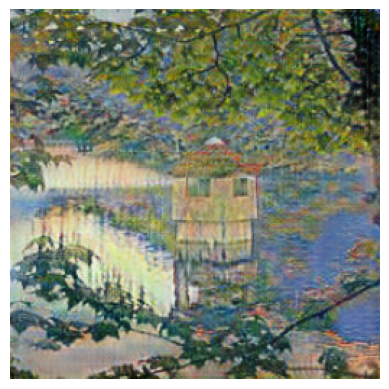

Time for epoch 180: 10 min 3 sec
Epoch 181/200
......................................................................
G Loss: 3.5558, D Photo Loss: 0.1270, D Monet Loss: 0.0363
No improvement in G Loss. Patience: 3/200
Time for epoch 181: 9 min 58 sec
Epoch 182/200
......................................................................
G Loss: 3.5364, D Photo Loss: 0.1269, D Monet Loss: 0.0360
Time for epoch 182: 9 min 46 sec
Epoch 183/200
......................................................................
G Loss: 3.5246, D Photo Loss: 0.1277, D Monet Loss: 0.0358
Time for epoch 183: 10 min 37 sec
Epoch 184/200
......................................................................
G Loss: 3.5229, D Photo Loss: 0.1274, D Monet Loss: 0.0356
Time for epoch 184: 10 min 26 sec
Epoch 185/200
......................................................................
G Loss: 3.5083, D Photo Loss: 0.1279, D Monet Loss: 0.0349


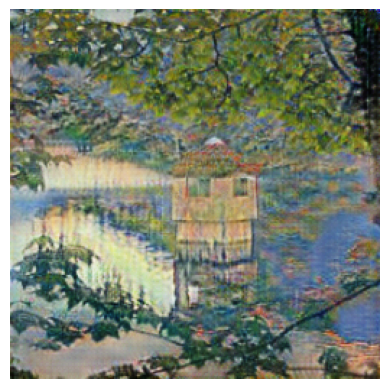

Time for epoch 185: 9 min 58 sec
Epoch 186/200
......................................................................
G Loss: 3.5111, D Photo Loss: 0.1281, D Monet Loss: 0.0348
No improvement in G Loss. Patience: 1/200
Time for epoch 186: 10 min 47 sec
Epoch 187/200
......................................................................
G Loss: 3.5124, D Photo Loss: 0.1276, D Monet Loss: 0.0349
No improvement in G Loss. Patience: 2/200
Time for epoch 187: 10 min 12 sec
Epoch 188/200
......................................................................
G Loss: 3.4971, D Photo Loss: 0.1284, D Monet Loss: 0.0346
Time for epoch 188: 10 min 30 sec
Epoch 189/200
......................................................................
G Loss: 3.4892, D Photo Loss: 0.1296, D Monet Loss: 0.0343
Time for epoch 189: 10 min 15 sec
Epoch 190/200
......................................................................
G Loss: 3.5076, D Photo Loss: 0.1299, D Monet Loss: 0.0347
No improvement in G Loss. P

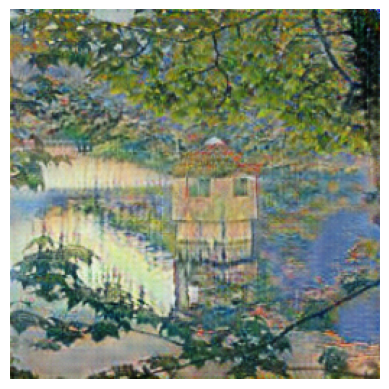

Time for epoch 190: 10 min 37 sec
Epoch 191/200
......................................................................
G Loss: 3.4890, D Photo Loss: 0.1310, D Monet Loss: 0.0343
Time for epoch 191: 10 min 3 sec
Epoch 192/200
......................................................................
G Loss: 3.4706, D Photo Loss: 0.1323, D Monet Loss: 0.0335
Time for epoch 192: 10 min 36 sec
Epoch 193/200
......................................................................
G Loss: 3.4783, D Photo Loss: 0.1312, D Monet Loss: 0.0337
No improvement in G Loss. Patience: 1/200
Time for epoch 193: 10 min 26 sec
Epoch 194/200
......................................................................
G Loss: 3.4681, D Photo Loss: 0.1328, D Monet Loss: 0.0335
Time for epoch 194: 9 min 57 sec
Epoch 195/200
......................................................................
G Loss: 3.4497, D Photo Loss: 0.1342, D Monet Loss: 0.0330


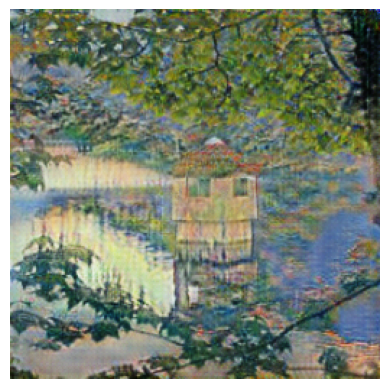

Time for epoch 195: 10 min 48 sec
Epoch 196/200
......................................................................
G Loss: 3.4511, D Photo Loss: 0.1360, D Monet Loss: 0.0332
No improvement in G Loss. Patience: 1/200
Time for epoch 196: 9 min 57 sec
Epoch 197/200
......................................................................
G Loss: 3.4436, D Photo Loss: 0.1361, D Monet Loss: 0.0330
Time for epoch 197: 9 min 51 sec
Epoch 198/200
......................................................................
G Loss: 3.4370, D Photo Loss: 0.1373, D Monet Loss: 0.0327
Time for epoch 198: 10 min 45 sec
Epoch 199/200
......................................................................
G Loss: 3.4265, D Photo Loss: 0.1381, D Monet Loss: 0.0324
Time for epoch 199: 10 min 9 sec
Epoch 200/200
......................................................................
G Loss: 3.4217, D Photo Loss: 0.1405, D Monet Loss: 0.0325


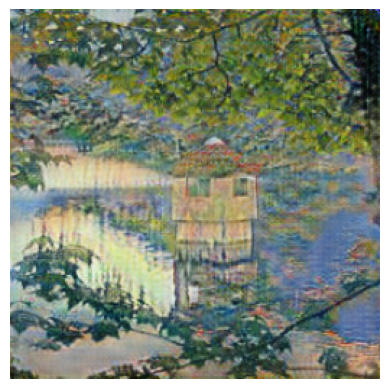

Time for epoch 200: 9 min 57 sec


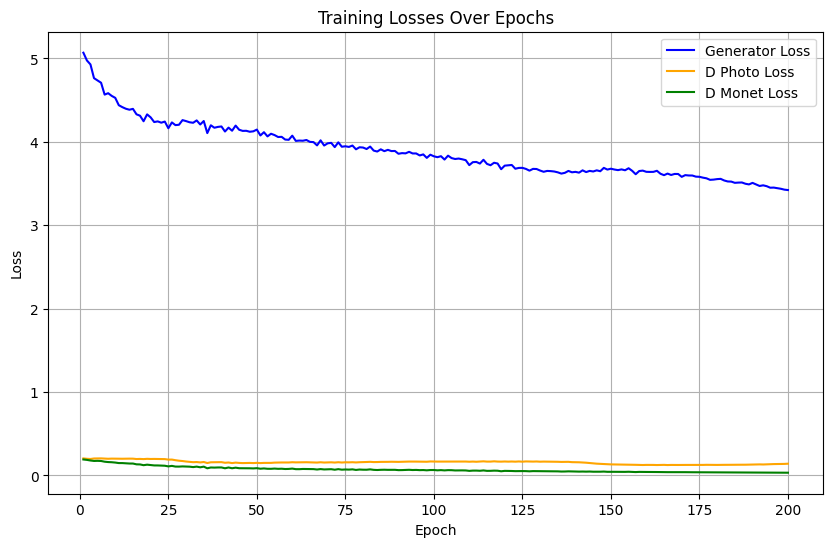

Final models saved!
Total training time: 33 hr 45 min


In [ ]:
import os
import time
import torch
from torch.cuda.amp import GradScaler, autocast
from torchvision.utils import save_image
import matplotlib.pyplot as plt

EPOCHS = 200  # Paper’s default
PATIENCE = 200  # Reasonable patience
checkpoint_dir = "checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

scaler = GradScaler()  # For mixed precision

# Lists to store losses for plotting
g_losses = []
d_photo_losses = []
d_monet_losses = []

def save_checkpoint(epoch, best=False):
    suffix = "_best" if best else f"_epoch_{epoch}"
    torch.save(G_photo_to_monet.state_dict(), os.path.join(checkpoint_dir, f"G_photo_to_monet{suffix}.pth"))
    torch.save(G_monet_to_photo.state_dict(), os.path.join(checkpoint_dir, f"G_monet_to_photo{suffix}.pth"))
    torch.save(D_photo.state_dict(), os.path.join(checkpoint_dir, f"D_photo{suffix}.pth"))
    torch.save(D_monet.state_dict(), os.path.join(checkpoint_dir, f"D_monet{suffix}.pth"))

def save_final_model():
    torch.save(G_photo_to_monet.state_dict(), os.path.join(checkpoint_dir, "G_photo_to_monet_final.pth"))
    torch.save(G_monet_to_photo.state_dict(), os.path.join(checkpoint_dir, "G_monet_to_photo_final.pth"))
    torch.save(D_photo.state_dict(), os.path.join(checkpoint_dir, "D_photo_final.pth"))
    torch.save(D_monet.state_dict(), os.path.join(checkpoint_dir, "D_monet_final.pth"))
    print("Final models saved!")

def adjust_lr(optimizer, epoch, initial_lr=0.0002, total_epochs=200, decay_start_epoch=100):
    if epoch < decay_start_epoch:
        return initial_lr
    decay_rate = (total_epochs - epoch) / (total_epochs - decay_start_epoch)
    lr = initial_lr * max(0.0, decay_rate)
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr
    return lr

def train_step(monet_real, photo_real):
    monet_real = monet_real.clone()
    photo_real = photo_real.clone()

    with autocast():
        monet_fake = G_photo_to_monet(photo_real)
        photo_fake = G_monet_to_photo(monet_real)
        monet_cycled = G_photo_to_monet(photo_fake)
        photo_cycled = G_monet_to_photo(monet_fake)
        monet_identity = G_photo_to_monet(monet_real)
        photo_identity = G_monet_to_photo(photo_real)

        G_adv_loss_photo = adversarial_loss(D_monet(monet_fake), torch.ones_like(D_monet(monet_fake)))
        G_adv_loss_monet = adversarial_loss(D_photo(photo_fake), torch.ones_like(D_photo(photo_fake)))
        G_cycle_loss = (cycle_loss_fn(monet_cycled, monet_real) + cycle_loss_fn(photo_cycled, photo_real)) * lambda_cycle
        G_identity_loss = (identity_loss_fn(monet_identity, monet_real) + identity_loss_fn(photo_identity, photo_real)) * lambda_identity
        G_loss = G_adv_loss_photo + G_adv_loss_monet + G_cycle_loss + G_identity_loss

    optimizer_G.zero_grad()
    scaler.scale(G_loss).backward()
    torch.nn.utils.clip_grad_norm_(G_photo_to_monet.parameters(), max_norm=1.0)
    torch.nn.utils.clip_grad_norm_(G_monet_to_photo.parameters(), max_norm=1.0)
    scaler.step(optimizer_G)
    scaler.update()

    with autocast():
        D_photo_real = D_photo(photo_real)
        D_photo_fake = D_photo(photo_fake.detach())
        D_photo_loss = (adversarial_loss(D_photo_real, torch.ones_like(D_photo_real)) +
                        adversarial_loss(D_photo_fake, torch.zeros_like(D_photo_fake))) * 0.5

        D_monet_real = D_monet(monet_real)
        D_monet_fake = D_monet(monet_fake.detach())
        D_monet_loss = (adversarial_loss(D_monet_real, torch.ones_like(D_monet_real)) +
                        adversarial_loss(D_monet_fake, torch.zeros_like(D_monet_fake))) * 0.5

    optimizer_D_photo.zero_grad()
    scaler.scale(D_photo_loss).backward()
    torch.nn.utils.clip_grad_norm_(D_photo.parameters(), max_norm=1.0)
    scaler.step(optimizer_D_photo)
    scaler.update()

    optimizer_D_monet.zero_grad()
    scaler.scale(D_monet_loss).backward()
    torch.nn.utils.clip_grad_norm_(D_monet.parameters(), max_norm=1.0)
    scaler.step(optimizer_D_monet)
    scaler.update()

    return G_loss.item(), D_photo_loss.item(), D_monet_loss.item()

# Define show_image function
def show_image(tensor):
    img = tensor[0] * 0.5 + 0.5  # Denormalize to [0, 1]
    img = img.numpy().transpose(1, 2, 0)  # Convert to HWC for plotting
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# Training with early stopping and loss plotting
start_time = time.time()
best_G_loss = float('inf')
patience_counter = 0
best_epoch = 0

for epoch in range(EPOCHS):
    print(f"Epoch {epoch + 1}/{EPOCHS}")
    epoch_start = time.time()
    total_G_loss, total_D_photo_loss, total_D_monet_loss = 0, 0, 0
    num_batches = 0

    adjust_lr(optimizer_G, epoch)
    adjust_lr(optimizer_D_photo, epoch)
    adjust_lr(optimizer_D_monet, epoch)

    for monet_real, photo_real in dataloader:
        monet_real, photo_real = monet_real.to(device), photo_real.to(device)
        g_loss, d_photo_loss, d_monet_loss = train_step(monet_real, photo_real)
        total_G_loss += g_loss
        total_D_photo_loss += d_photo_loss
        total_D_monet_loss += d_monet_loss
        num_batches += 1
        if num_batches % 100 == 0:
            print(".", end="")

    avg_G_loss = total_G_loss / num_batches
    avg_D_photo_loss = total_D_photo_loss / num_batches
    avg_D_monet_loss = total_D_monet_loss / num_batches
    print(f"\nG Loss: {avg_G_loss:.4f}, D Photo Loss: {avg_D_photo_loss:.4f}, D Monet Loss: {avg_D_monet_loss:.4f}")

    # Store losses for plotting
    g_losses.append(avg_G_loss)
    d_photo_losses.append(avg_D_photo_loss)
    d_monet_losses.append(avg_D_monet_loss)

    if avg_G_loss < best_G_loss:
        best_G_loss = avg_G_loss
        best_epoch = epoch + 1
        save_checkpoint(epoch + 1, best=True)
        patience_counter = 0
    else:
        patience_counter += 1
        print(f"No improvement in G Loss. Patience: {patience_counter}/{PATIENCE}")

    if patience_counter >= PATIENCE:
        print(f"Early stopping triggered at epoch {epoch + 1}. Best model saved from epoch {best_epoch}.")
        break

    if (epoch + 1) % 5 == 0:
        with torch.no_grad():
            fake_monet = G_photo_to_monet(photo_batch.to(device))
            save_image(fake_monet * 0.5 + 0.5, os.path.join(output_dir, f"epoch_{epoch+1}_fake_monet.png"))
            show_image(fake_monet.cpu())
        save_checkpoint(epoch + 1)

    epoch_time = time.time() - epoch_start
    print(f"Time for epoch {epoch + 1}: {epoch_time // 60:.0f} min {epoch_time % 60:.0f} sec")

# Plot losses
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(g_losses) + 1), g_losses, label='Generator Loss', color='blue')
plt.plot(range(1, len(d_photo_losses) + 1), d_photo_losses, label='D Photo Loss', color='orange')
plt.plot(range(1, len(d_monet_losses) + 1), d_monet_losses, label='D Monet Loss', color='green')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Losses Over Epochs')
plt.legend()
plt.grid(True)
plt.savefig(os.path.join(output_dir, 'training_losses.png'))
plt.show()

# Save final model after training
save_final_model()

total_time = time.time() - start_time
print(f"Total training time: {total_time // 3600:.0f} hr {(total_time % 3600) // 60:.0f} min")

Step 7: Final submission folder is generated and sharpening of images is done

In [ ]:
import zipfile
import shutil
from PIL import ImageFilter

# Define paths
submission_dir = "monet_generated"
checkpoint_file = "checkpoints/G_photo_to_monet_final.pth"  # Explicitly using this filename

# Create submission directory
os.makedirs(submission_dir, exist_ok=True)

# Load the trained generator from the checkpoint
if os.path.exists(checkpoint_file):
    G_photo_to_monet.load_state_dict(torch.load(checkpoint_file, map_location=device))
    print(f"Loaded checkpoint from {checkpoint_file}")
else:
    raise FileNotFoundError(f"Checkpoint {checkpoint_file} not found!")

# Set to evaluation mode
G_photo_to_monet.eval()

# Create dataloader (assuming dataset and transform are still in memory )
photo_loader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=2)

# Generate Monet-style images
with torch.no_grad():
    for i, (monet_img, photo_img) in enumerate(photo_loader):
        photo_img = photo_img.to(device)
        fake_monet = G_photo_to_monet(photo_img)
        fake_monet = fake_monet * 0.5 + 0.5  # Denormalize to [0, 1]
        # Apply sharpening
        fake_monet_pil = transforms.ToPILImage()(fake_monet[0].cpu())
        fake_monet_pil = fake_monet_pil.filter(ImageFilter.SHARPEN)
        fake_monet = transforms.ToTensor()(fake_monet_pil)
        # Save the generated image
        save_image(fake_monet, os.path.join(submission_dir, f"{i+1}.jpg"))
        print(f"Saved generated image {i+1}.jpg")

# Create submission zip
with zipfile.ZipFile("submission.zip", "w") as zipf:
    for file in os.listdir(submission_dir):
        zipf.write(os.path.join(submission_dir, file), file)

# Clean up
shutil.rmtree(submission_dir)
print("Submission zip created!")

Loaded checkpoint from checkpoints/G_photo_to_monet_final.pth
Saved generated image 1.jpg
Saved generated image 2.jpg
Saved generated image 3.jpg
Saved generated image 4.jpg
Saved generated image 5.jpg
Saved generated image 6.jpg
Saved generated image 7.jpg
Saved generated image 8.jpg
Saved generated image 9.jpg
Saved generated image 10.jpg
Saved generated image 11.jpg
Saved generated image 12.jpg
Saved generated image 13.jpg
Saved generated image 14.jpg
Saved generated image 15.jpg
Saved generated image 16.jpg
Saved generated image 17.jpg
Saved generated image 18.jpg
Saved generated image 19.jpg
Saved generated image 20.jpg
Saved generated image 21.jpg
Saved generated image 22.jpg
Saved generated image 23.jpg
Saved generated image 24.jpg
Saved generated image 25.jpg
Saved generated image 26.jpg
Saved generated image 27.jpg
Saved generated image 28.jpg
Saved generated image 29.jpg
Saved generated image 30.jpg
Saved generated image 31.jpg
Saved generated image 32.jpg
Saved generated ima